In [1]:
import re
import string

def text_temizle1(text):
    #kucuk harf yap
    text = text.lower()
    #parantez içindeki yazıları sil
    text = re.sub('\[.*?\]', '', text)
    #noktalama işaretlerini sil
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    #sayıları sil
    text = re.sub('\w*\d\w*', '', text)
    #3 karakterden kısa olan sözcükleri sil türkçe karakterlerle birlikte
    text = re.sub(r'\b[a-zğüşöçıİĞÜŞÖÇ]{1,2}\b', r'',text)
    return text

In [2]:
import tweepy
import pandas as pd
import warnings
warnings.filterwarnings(action = 'ignore')
access_token = "4643784988-lVqQxcJqbSz3nf1C2QsfEqClnh1gDAiur44qhXx"
access_token_secret = "s1ronrb01KE9ezxArFSVgeUMgvGFq6mOh9c9HsKuYKlvJ"
consumer_key = "e4hDcQIzGTKewbysmz2TbYIZd"
consumer_secret= "t6vx97uZaG7FmAcCuzVB1MdeKbWFxJ3ucCmHwFtytLlo2K11NE"
auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_token_secret)
api = tweepy.API(auth,wait_on_rate_limit=True)


In [3]:
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from nltk.tokenize import sent_tokenize, word_tokenize
import requests
import numpy as np
import matplotlib.pyplot as plt
from gensim.parsing.preprocessing import remove_stopwords

In [4]:
class TwitterSentimentAnalyser:
    def __init__(self, consumer_key, consumer_secret, access_token, access_token_secret, keyword, tweetCount):
        self.keyword = keyword
        self.consumer_key = consumer_key
        self.consumer_secret = consumer_secret
        self.access_token = access_token
        self.access_token_secret = access_token_secret
        self.tweetCount = tweetCount
        
    def getTwitterData(self):
        tweets_list = []
        
        for tweet in api.search_tweets(q=self.keyword, count=self.tweetCount, lang='en-en'):
            tweets_list.append((tweet.created_at,tweet.id,tweet.text))
            
        self.tweets = pd.DataFrame(tweets_list, columns=["Tarih",'Tweet_id','Text'])


In [5]:
twst = TwitterSentimentAnalyser(consumer_key = consumer_key, consumer_secret = consumer_secret,
                                access_token = access_token, access_token_secret = access_token_secret,
                                keyword='corona', tweetCount=1000)


In [6]:
twst.getTwitterData()
twst.tweets.head()
data = twst.tweets.copy()

In [7]:
def preProcess(ReviewText):
    #Verideki <br> taglarını kaldır.
    ReviewText = ReviewText.str.lower()
    ReviewText = ReviewText.str.replace("(rt)", "")
    ReviewText = ReviewText.str.replace("(retweet)", "")
    ReviewText = ReviewText.str.replace("(<br/>)", "")
    ReviewText = ReviewText.str.replace('(<a).*(>).*(</a>)', '')
    ReviewText = ReviewText.str.replace('(&amp)', '')
    ReviewText = ReviewText.str.replace('(&gt)', '')
    ReviewText = ReviewText.str.replace('(&lt)', '')
    ReviewText = ReviewText.str.replace('(\xa0)', ' ') 
    #Verideki Linkleri Kaldır.
    ReviewText = ReviewText.str.replace(r'http[s]?://(?:[a-z]|[0-9]|[$-_@.&amp;+]|[!*\(\),]|(?:%[0-9a-f][0-9a-f]))+', ' ')
    return ReviewText
data['Text'] = preProcess(data['Text'])

In [8]:
#import nltk.stem as stemmer
from tqdm import tqdm
import socket
from TurkishStemmer import TurkishStemmer

stemmer = TurkishStemmer()
stemmed_lists = []
for index in tqdm(data.index):
    mini_l = []
    for text in data.loc[index]['Text'].split(" "):
        mini_l.append(stemmer.stem(text))

    big_text=" "
    for char in mini_l:
        big_text = big_text + " " + char
    stemmed_lists.append(big_text)
    
data['stemmed'] = stemmed_lists
data.head()

100%|██████████████████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 2179.80it/s]


,Tarih,Tweet_id,Text,stemmed
0,2022-01-23 15:28:39+00:00,1485273278549794824,@argonerd @joerncarmaker saying from a person ...,@argonerd @joerncarmaker saying from a perso...
1,2022-01-23 15:28:39+00:00,1485273278189281283,@hindisyahi: 6 yrs me ek exam liye hain aur a...,@hindisyahi: 6 yrs me ek exam li hai aur ab...
2,2022-01-23 15:28:35+00:00,1485273261801971723,@greenswelfares: protection from the virus- m...,@greenswelfares: protection from the virus-...
3,2022-01-23 15:28:35+00:00,1485273260728233988,@clacaeuropa: is it widely known in the uk th...,@clacaeuropa: is it widely known in the uk ...
4,2022-01-23 15:28:33+00:00,1485273255917326336,@usmoality: 🚨 just in: new study by german pr...,@usmoality: 🚨 just in: new study by german ...


In [9]:
data.head()
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer().fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

In [10]:
from nltk.corpus import stopwords
#from nltk.tokenize import word_tokenize

eng_stopwords = stopwords.words('english') 

def remove_mystopwords(data):
    tokens = sentence.split(" ")
    tokens_filtered= [word for word in text_tokens if not word in my_stopwords]
    return (" ").join(tokens_filtered)
print(data)

                       Tarih             Tweet_id  \
0  2022-01-23 15:28:39+00:00  1485273278549794824   
1  2022-01-23 15:28:39+00:00  1485273278189281283   
2  2022-01-23 15:28:35+00:00  1485273261801971723   
3  2022-01-23 15:28:35+00:00  1485273260728233988   
4  2022-01-23 15:28:33+00:00  1485273255917326336   
..                       ...                  ...   
95 2022-01-23 15:24:04+00:00  1485272124021518340   
96 2022-01-23 15:23:55+00:00  1485272088038772737   
97 2022-01-23 15:23:50+00:00  1485272067159339013   
98 2022-01-23 15:23:50+00:00  1485272067096387585   
99 2022-01-23 15:23:49+00:00  1485272062340272135   

                                                 Text  \
0   @argonerd @joerncarmaker saying from a person ...   
1    @hindisyahi: 6 yrs me ek exam liye hain aur a...   
2    @greenswelfares: protection from the virus- m...   
3    @clacaeuropa: is it widely known in the uk th...   
4    @usmoality: 🚨 just in: new study by german pr...   
..                   

In [11]:
data_clean = pd.DataFrame(data.Text.apply(text_temizle1))
data_clean

,Text
0,argonerd joerncarmaker saying from person che...
1,hindisyahi yrs exam liye hain aur abhi cor...
2,greenswelfares protection from the virus mask...
3,clacaeuropa widely known the that decemb...
4,usmoality 🚨 just new study german prof kuhb...
...,...
95,cbsphilly don’ stray far off campus corona t...
96,dineshdsouza the lady absolutely right fear ...
97,shaneparr alicebellamy mitrebarnet andrewleedr...
98,covidlive new cases and new deaths germany...


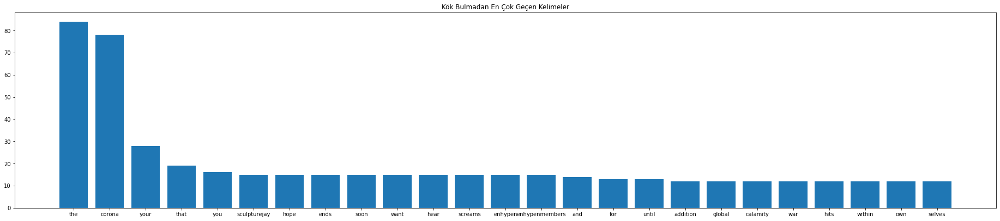

In [12]:
from sklearn.feature_extraction.text import CountVectorizer

common_words = get_top_n_words(data_clean['Text'], 25)
df2 = pd.DataFrame(common_words, columns = ['kelime' , 'geçiş frekansı'])
fig = plt.figure(figsize=[25,5])
ax = fig.add_axes([0,0,1,1])
ax.bar(df2.kelime,df2['geçiş frekansı'])
plt.title('Kök Bulmadan En Çok Geçen Kelimeler')
plt.show()


In [13]:

def red_color_func(word=None, font_size=None, position=None, orientation=None, font_path=None, random_state=None):
    return "#85bb65"

text = " ".join(review for review in data.Text)

wordcloud = WordCloud().generate(text)


# Generate a wordcloud
wordcloud.generate(text)
wordcloud.to_file("wordcloud.png")
# show
plt.figure(figsize=[200,100])
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()


In [16]:
dataFrame0 = pd.read_csv(r"C:\Users\Ferhat\Desktop\Projeler\Tez\testdata.manual.2009.06.14.csv")

In [17]:
dataFrame0

,4,3,Mon May 11 03:17:40 UTC 2009,kindle2,tpryan,"@stellargirl I loooooooovvvvvveee my Kindle2. Not that the DX is cool, but the 2 is fantastic in its own right."
0,4,4,Mon May 11 03:18:03 UTC 2009,kindle2,vcu451,Reading my kindle2... Love it... Lee childs i...
1,4,5,Mon May 11 03:18:54 UTC 2009,kindle2,chadfu,"Ok, first assesment of the #kindle2 ...it fuck..."
2,4,6,Mon May 11 03:19:04 UTC 2009,kindle2,SIX15,@kenburbary You'll love your Kindle2. I've had...
3,4,7,Mon May 11 03:21:41 UTC 2009,kindle2,yamarama,@mikefish Fair enough. But i have the Kindle2...
4,4,8,Mon May 11 03:22:00 UTC 2009,kindle2,GeorgeVHulme,@richardebaker no. it is too big. I'm quite ha...
...,...,...,...,...,...,...
492,2,14072,Sun Jun 14 04:31:43 UTC 2009,latex,proggit,Ask Programming: LaTeX or InDesign?: submitted...
493,0,14073,Sun Jun 14 04:32:17 UTC 2009,latex,sam33r,"On that note, I hate Word. I hate Pages. I hat..."
494,4,14074,Sun Jun 14 04:36:34 UTC 2009,latex,iamtheonlyjosie,Ahhh... back in a *real* text editing environm...
495,0,14075,Sun Jun 14 21:36:07 UTC 2009,iran,plutopup7,"Trouble in Iran, I see. Hmm. Iran. Iran so far..."


In [18]:
dataFrame0["@stellargirl I loooooooovvvvvveee my Kindle2. Not that the DX is cool, but the 2 is fantastic in its own right."]

0      Reading my kindle2...  Love it... Lee childs i...
1      Ok, first assesment of the #kindle2 ...it fuck...
2      @kenburbary You'll love your Kindle2. I've had...
3      @mikefish  Fair enough. But i have the Kindle2...
4      @richardebaker no. it is too big. I'm quite ha...
                             ...                        
492    Ask Programming: LaTeX or InDesign?: submitted...
493    On that note, I hate Word. I hate Pages. I hat...
494    Ahhh... back in a *real* text editing environm...
495    Trouble in Iran, I see. Hmm. Iran. Iran so far...
496    Reading the tweets coming out of Iran... The w...
Name: @stellargirl I loooooooovvvvvveee my Kindle2. Not that the DX is cool, but the 2 is fantastic in its own right., Length: 497, dtype: object

In [19]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(dataFrame0["@stellargirl I loooooooovvvvvveee my Kindle2. Not that the DX is cool, but the 2 is fantastic in its own right."], dataFrame0["4"], test_size=0.2)

In [20]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import classification_report

In [21]:
#seçtiğimiz stop wordsları çıkarıcak şekilde vektörleştiriyoruz
cv = CountVectorizer()
X_train_count = cv.fit_transform(X_train.values)
X_train_count.toarray()[:33]

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [22]:
from sklearn.svm import SVC

In [23]:
model = SVC()
model.fit(X_train_count,y_train)

X_test_count = cv.transform(X_test)
accuracy = model.score(X_test_count,y_test)

In [24]:
pred = model.predict(X_test_count)
result = pd.DataFrame(classification_report(y_test,pred,output_dict=True))

In [25]:
result

,0,2,4,accuracy,macro avg,weighted avg
precision,0.880000,0.571429,0.617021,0.67,0.689483,0.703381
recall,0.594595,0.666667,0.743590,0.67,0.668284,0.670000
f1-score,0.709677,0.615385,0.674419,0.67,0.666494,0.673296
support,37.000000,24.000000,39.000000,0.67,100.000000,100.000000


In [26]:
X_test_count2 = cv.transform(data_clean["Text"])
pred2 = model.predict(X_test_count2)

print(pred2)

[0 4 4 4 4 4 4 4 4 4 4 4 4 4 0 4 4 4 0 2 4 4 0 4 2 4 2 4 4 0 0 0 0 0 0 4 0
 2 4 4 0 0 2 4 2 4 0 0 4 4 0 2 0 4 0 4 2 2 4 0 4 0 0 4 0 4 4 4 0 0 0 4 4 0
 0 4 4 4 2 4 4 4 4 4 4 0 4 4 0 4 2 4 0 4 4 4 4 2 4 0]


In [27]:
data_clean["result"] = pred2

In [28]:
data_clean

,Text,result
0,argonerd joerncarmaker saying from person che...,0
1,hindisyahi yrs exam liye hain aur abhi cor...,4
2,greenswelfares protection from the virus mask...,4
3,clacaeuropa widely known the that decemb...,4
4,usmoality 🚨 just new study german prof kuhb...,4
...,...,...
95,cbsphilly don’ stray far off campus corona t...,4
96,dineshdsouza the lady absolutely right fear ...,4
97,shaneparr alicebellamy mitrebarnet andrewleedr...,2
98,covidlive new cases and new deaths germany...,4
